In [171]:
%pylab inline
from __future__ import print_function
import os
import IPython

import numpy as np
import scipy
import sklearn.mixture

import librosa
import mir_eval

Populating the interactive namespace from numpy and matplotlib


In [111]:
DATA_PATH = '/Users/dpwe/Downloads/prac10'

In [279]:
def read_file_list(filename):
    """Read a text file with one item per line."""
    items = []
    with open(list_filename, 'r') as f:
        for line in f:
            items.append(line.strip())
    return items

train_list_filename = os.path.join(DATA_PATH, 'trainfilelist.txt')
train_files = read_file_list(train_list_filename)
print(len(train_files))
print(train_files[134])


141
beatles/Let_It_Be/06-Let_It_Be


In [231]:
def load_chroma(track):
    """Load and normalize the chroma data for a track."""
    filename = os.path.join(DATA_PATH, 'data', 'chroma', track)
    data = scipy.io.loadmat(filename)
    chroma = data['F'].transpose()
    times = data['bts'][0]
    chroma = chroma / np.max(chroma, axis=1)[:, np.newaxis]
    return chroma, times

def load_labels(track):
    """Load in the chord data for a track."""
    filename = os.path.join(DATA_PATH, 'data', 'labels', track)
    data = scipy.io.loadmat(filename)
    times = data['bts'][0]
    labels = data['L'][:, 0].astype(int)
    return labels, times

In [283]:
chroma, beat_times = load_chroma(train_files[134])
labels, label_times = load_labels(train_files[134])
print(chroma.shape)
print(beat_times.shape)
print(labels.shape)

(555, 12)
(555,)
(555,)


In [128]:
sr = 16000
y = mir_eval.sonify.chroma(chroma.transpose(), beat_times, sr)
IPython.display.Audio(data=y, rate=sr)

In [298]:
def my_imshow(data, **kwargs):
    """Wrapper for imshow setting common defaults."""
    plt.imshow(data, interpolation='nearest', aspect='auto', origin='bottom', cmap='gray_r', **kwargs)

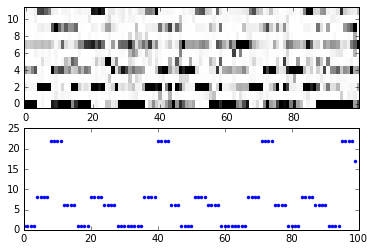

In [299]:
plt.subplot(211)
my_imshow(chroma[:100, :].transpose())
plt.subplot(212)
plt.plot(labels[:100], '.')

In [237]:
def train_chord_models(train_file_list):
    """[Models, Transitions, Priors] = train_chord_models(TrainFileList)
    %     Train single-Gaussian models of chords by loading the Chroma
    %     features and the corresponding chord label data from each of
    %     the items named in the TrainFileList cell array.  Return
    %     Models as an array of Gaussian models (e.g. Models(i).mean
    %     and Models(i).sigma as the covariance), and a transition
    %     matrix in Transitions. 
    % 2010-04-07 Dan Ellis dpwe@ee.columbia.edu  after extractFeaturesAndTrain.m
    """
    # load training data
    # Concatenate all the features and labels into one long list
    features = []
    labels = []
    for train_id in train_file_list:
        features.append(load_chroma(train_id)[0])
        labels.append(load_labels(train_id)[0])
    # Turn the lists of arrays into single arrays.
    features = np.concatenate(features)
    labels = np.concatenate(labels)
    print('Training features shape:', features.shape)

    num_chroma = 12
    NOCHORD = 0
    # Build models
    # We have a major and a minor chord model for each chroma, plus NOCHORD
    num_models = 2 * num_chroma + 1
    # Global mean/covariance used for empty models.
    global_model = sklearn.mixture.GMM(n_components=1, covariance_type='full')
    global_model.fit(features)
    # Individual models for all chords.
    models = []
    for model_index in xrange(num_models):
        # labels contains one value in the range 0..24 for each row of features.
        true_example_rows = np.nonzero(labels == model_index)
        if true_example_rows:
            # mean and cov expect data in columns, not rows - transpose twice
            model = sklearn.mixture.GMM(n_components=1, covariance_type='full')
            model.fit(features[true_example_rows])
            models.append(model)
        else:
            models.append(global_model)
    # Count the number of transitions in the label set
    # (transitions between tracks get factored in ... oh well).
    # Each element of gtt is a 4 digit number indicating one transition 
    # e.g. 2400 for 24 -> 0.
    gtt = 100*labels[:-1] + labels[1:]
    # Arrange these into the transition matrix by counting each type.
    transitions = np.zeros((num_models, num_models))
    for i in xrange(num_models):
        for j in xrange(num_models):
            nn = 100 * i + j 
            # Add one to all counts, so no transitions have zero probability.
            transitions[i, j] = 1 + np.count_nonzero(gtt==nn)
    # Priors of each chord = total count of pairs starting in that chord.
    priors = np.sum(transitions, axis=1)
    # Normalize each row of transitions.
    transitions /= priors[:, np.newaxis]
    # Normalize priors too.
    priors /= np.sum(priors)
    
    return models, transitions, priors

Training features shape: (65355, 12)


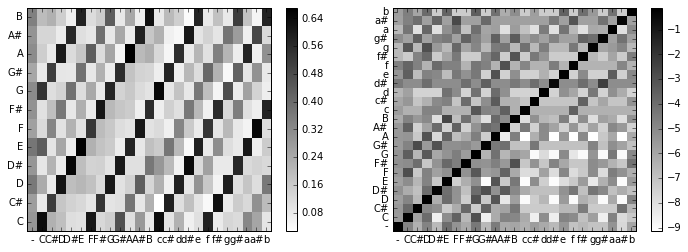

In [297]:
models, transitions, priors = train_chord_models(train_files)
model_means = np.concatenate([model.means_ for model in models])
plt.figure(figsize=(12,4))
plt.subplot(121)
my_imshow(model_means.transpose())
plt.colorbar()
all_chords = ['-', 'C', 'C#', 'D', 'D#', 'E', 'F', 'F#', 'G', 'G#', 'A', 'A#', 
              'B', 'c', 'c#', 'd', 'd#', 'e', 'f', 'f#', 'g', 'g#', 'a', 'a#', 'b']
plt.xticks(np.arange(25), all_chords)
plt.yticks(np.arange(12), all_chords[1:13])
plt.subplot(122)
my_imshow(np.log(transitions))
plt.xticks(np.arange(25), all_chords)
plt.yticks(np.arange(25), all_chords)
plt.colorbar()

(25, 555)


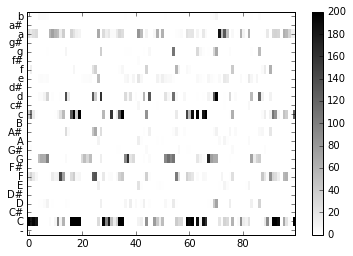

In [300]:
scores = np.array([model.score(chroma) for model in models])
print(scores.shape)
my_imshow(np.exp(scores[:, :100]), clim=[0, 200])
plt.colorbar()
_ = plt.yticks(np.arange(25), all_chords)
#plot(np.exp(models[1].score(model_means)))

In [252]:
def model_likelihoods(model, data):
    """Evaluate GMM likelihoods for a matrix of feature frames."""
    return model.score(data)

def viterbi_path(posteriors, transitions, priors):
    """Calculate Viterbi (best-cost) path through Markov model.
    
    Args:
      posteriors: np.array sized (num_frames, num_states) giving the 
        local-match posterior probability of being in state j at time i.
      transitions: np.array of (num_states, num_states).  For each row, 
        transitions(row, col) gives the probability of transitioning from
        state row to state col.
      priors: np.array of (num_states,) giving prior probability of 
        each state.    
    """
    num_frames, num_states = posteriors.shape
    traceback = np.zeros((num_frames, num_states), dtype=int)
    # Normalized best probability-to-date for each state.
    best_prob = priors * posteriors[0]
    best_prob /= np.sum(best_prob)
    for frame in xrange(1, num_frames):
        # Find most likely combination of previous prob-to-path, and transition.
        possible_transition_scores = (transitions * 
                                      np.outer(best_prob, posteriors[frame]))
        # The max is found for each destination state (column), so the max
        # is over all the possible preceding states (rows).
        traceback[frame] = np.argmax(possible_transition_scores, axis=0)
        best_prob = np.max(possible_transition_scores, axis=0)
        best_prob /= np.sum(best_prob)
    # Traceback from best final state to get best path.
    path = np.zeros(num_frames, dtype=int)
    path[-1] = np.argmax(best_prob)
    for frame in xrange(num_frames - 1, 0, -1):
        path[frame - 1] = traceback[frame, path[frame]]
    return path

def recognize_chords(chroma, models, transitions, priors):
    """Perform chord recognition on chroma feature matrix."""
    scores = np.array([model.score(chroma) for model in models])
    chords = viterbi_path(np.exp(scores.transpose()), transitions, priors)
    return chords, scores

(0, 100)

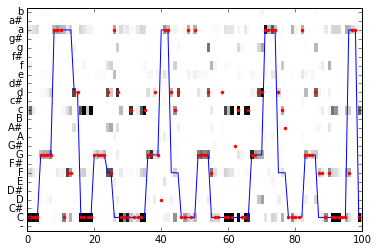

In [301]:
# Run chord recognition and plot best path over likelihoods.
hyp_chords, scores = recognize_chords(chroma, models, transitions, priors)
max_time = 100
my_imshow(np.exp(scores[:, :max_time]), clim=[0, 200])
plt.plot(hyp_chords[:max_time])
plt.yticks(np.arange(25), all_chords)
# Compare to most-likely chord at each time.
most_likely = np.argmax(scores, axis=0)
plt.plot(most_likely[:max_time], '.r')
plt.xlim(0, max_time)

In [263]:
true_chords, times = load_labels(train_files[134])
print(true_chords.shape)
print(np.mean(true_chords == hyp_chords))
print(np.mean(true_chords == most_likely))

(555,)
0.713513513514
0.459459459459


In [268]:
chord_table = ['X']
roots = all_chords[1:13]
for root in roots:
    chord_table.append(root + ":maj")
for root in roots:
    chord_table.append(root + ":min")
print(np.mean(mir_eval.chord.majmin([chord_table[chord] for chord in true_chords], 
                            [chord_table[chord] for chord in hyp_chords])))

0.711711711712


In [267]:
print(hyp_chords[-1])

6


0.713513513514


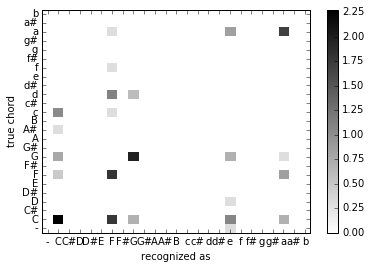

In [302]:
def score_chord_recognition(hyp_chords, true_chords):
    """Calculate confusions and return accuracy."""
    num_labels = 25
    confusions = sklearn.metrics.confusion_matrix(hyp_chords, true_chords, labels=np.arange(num_labels))
    score = np.sum(np.diag(confusions)) / float(np.sum(confusions))
    return score, confusions

score, confusions = score_chord_recognition(hyp_chords, true_chords)
print(score)

my_imshow(np.log10(np.maximum(1, confusions)))
plt.colorbar()
plt.xticks(np.arange(25), all_chords)
plt.yticks(np.arange(25), all_chords)
plt.xlabel('recognized as')
plt.ylabel('true chord')

In [276]:
def labels_to_chroma(labels):
    """Generate canonical chroma patterns from chord labels."""
    num_labels= len(labels)
    num_chroma = 12
    chroma = np.zeros((num_labels, num_chroma))
    for frame, label in enumerate(labels):
        if label > 12:
            # minor chord.
            chroma[frame, np.mod(np.array([0, 3, 7]) + (label - 13), 12)] = 1
        elif label > 0:
            # major chord.
            chroma[frame, np.mod(np.array([0, 4, 7]) + (label - 1), 12)] = 1
    return chroma

y = mir_eval.sonify.chroma(labels_to_chroma(hyp_chords).transpose(), times, sr)
IPython.display.Audio(data=y, rate=sr)

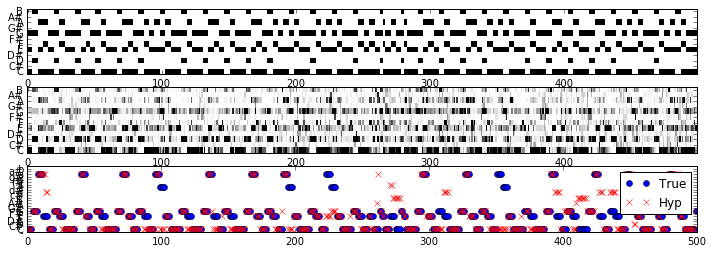

In [308]:
# Compare ideal chroma, actual chroma, and recognized and true chord labels.
max_time = 500
plt.figure(figsize=(12,4))
plt.subplot(311)
my_imshow(labels_to_chroma(true_chords[:max_time]).transpose())
plt.yticks(np.arange(12), all_chords[1:13])
plt.subplot(312)
my_imshow(chroma[:max_time].transpose())
plt.yticks(np.arange(12), all_chords[1:13])
plt.subplot(313)
plt.plot(true_chords[:max_time], 'ob', label='True')
plt.plot(hyp_chords[:max_time], 'xr', label='Hyp')
plt.yticks(np.arange(25), all_chords)
plt.legend()

Overall recognition accuracy = 0.582


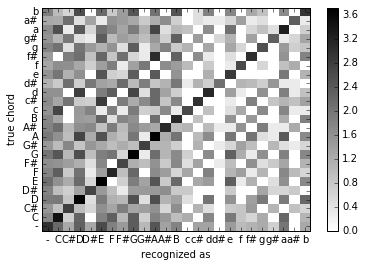

In [303]:
def test_chord_models(test_files, models, transitions, priors):
    """"Test chord recognizer on multiple tracks."""
    # Total # labels = Total # models = {major,minor} x {all chroma} + NOCHORD.
    num_chroma = 12
    num_labels = 2 * num_chroma + 1
    NOCHORD = 0

    # Initialize confusion matrix.
    all_confusions = np.zeros((num_labels, num_labels))

    # Run recognition on each file individually.
    for file_id in test_files:
        chroma, _ = load_chroma(file_id)
        true_labels, _ = load_labels(file_id)
        hyp_labels, _ = recognize_chords(chroma, models, transitions, priors)
        score, confusions = score_chord_recognition(hyp_labels, true_labels)
        all_confusions += confusions

    # Exclude regions where both streams report No Chord (e.g. lead
    # in/lead out)

    true_nothing_count = all_confusions[NOCHORD, NOCHORD]

    all_score = ((np.sum(np.diag(all_confusions)) - true_nothing_count) / 
                 (np.sum(all_confusions) - true_nothing_count))

    print('Overall recognition accuracy = {:.3f}'.format(all_score))
    return all_score, all_confusions

test_files = read_file_list(os.path.join(DATA_PATH, 'testfilelist.txt'))
score, confusions = test_chord_models(test_files, models, transitions, priors)

my_imshow(np.log10(np.maximum(1, confusions)))
plt.colorbar()
plt.xticks(np.arange(25), all_chords)
plt.yticks(np.arange(25), all_chords)
plt.xlabel('recognized as')
plt.ylabel('true chord')